In [116]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler

In [2]:
energy_data = pd.read_csv('/home/nissatech/Documents/Double Machine Learning/Raw Data/energy_data.csv')

In [3]:
env_data = pd.read_csv('/home/nissatech/Documents/Double Machine Learning/Raw Data/environment_data.csv')

<h1>1 Exploratory data analysis</h1>

<h2>1.1 Environment data </h2>

In [4]:
env_data.head()

,timestamp,CO2,humidity,pm10,pm1_0,pm2_5,pressure,temp,voc
0,2023-04-03 00:00:00.902,422.0,23.051195,52.0,28.0,41.0,989.378235,26.978621,32451.0
1,2023-04-03 00:00:01.734,422.0,23.038948,52.0,28.0,41.0,989.385864,26.999065,32450.0
2,2023-04-03 00:00:02.567,422.0,23.010489,52.0,28.0,41.0,989.416260,26.993956,32463.0
3,2023-04-03 00:00:03.471,421.0,23.010489,51.0,28.0,41.0,989.408630,26.993956,32467.0
4,2023-04-03 00:00:04.303,421.0,23.010685,51.0,28.0,41.0,989.435303,26.988844,32466.0


In [134]:
env_data.columns

Index(['timestamp', 'CO2', 'humidity', 'pm10', 'pm1_0', 'pm2_5', 'pressure',
       'temp', 'voc'],
      dtype='object')

<h3>1.1.1 Environment data indexing</h3>

In [5]:
df_indexed_env_data = env_data.copy()
df_indexed_env_data['timestamp'] = pd.to_datetime(df_indexed_env_data['timestamp'])
df_indexed_env_data.index = df_indexed_env_data['timestamp']
del df_indexed_env_data['timestamp']

<h3>1.1.2 Environment data visualization</h3>

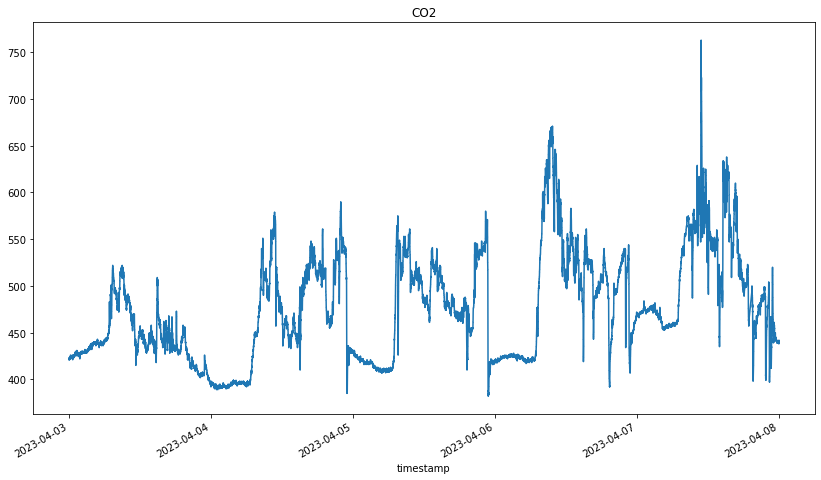

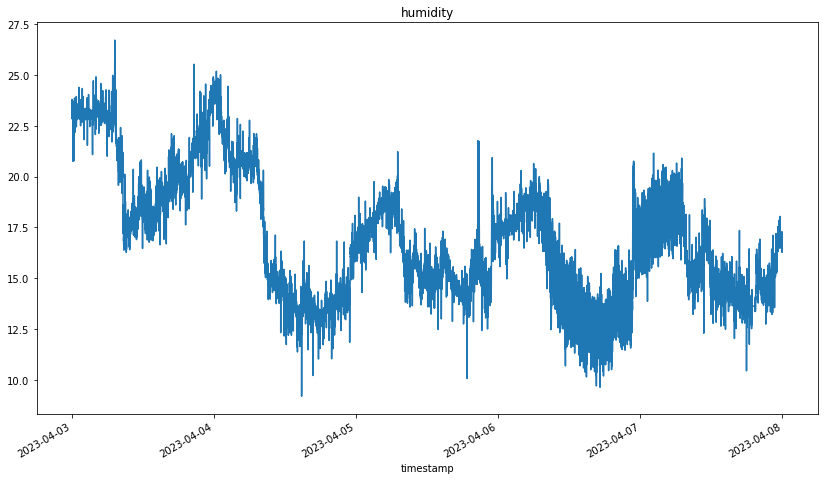

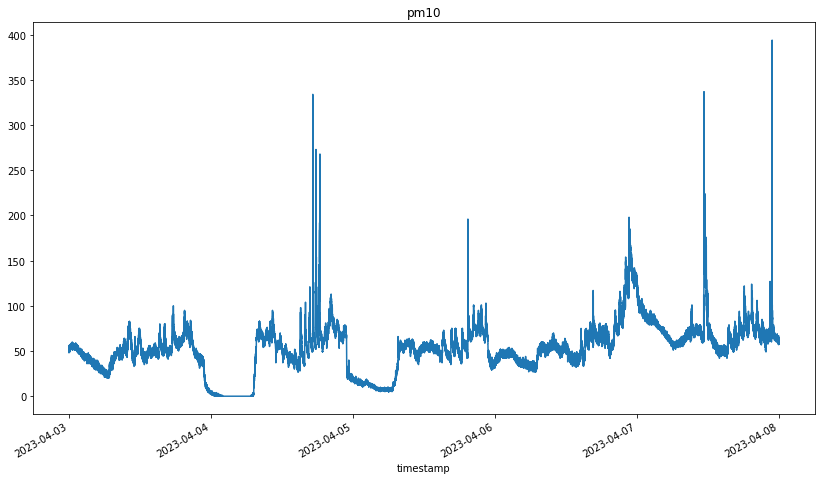

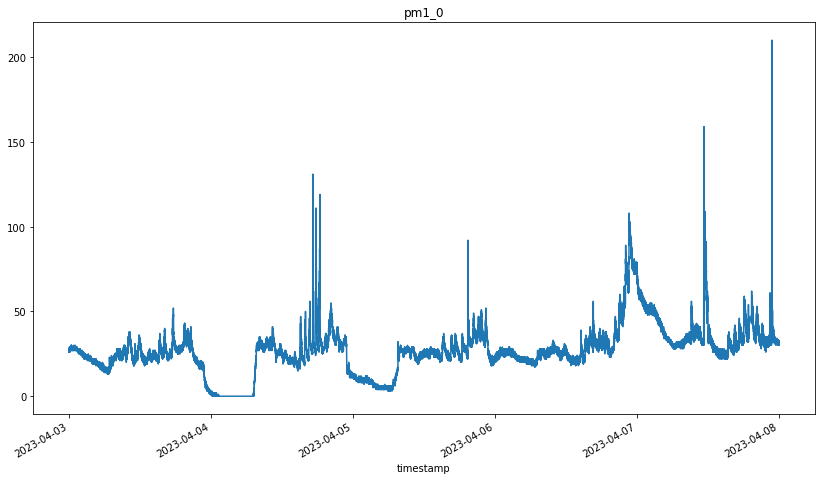

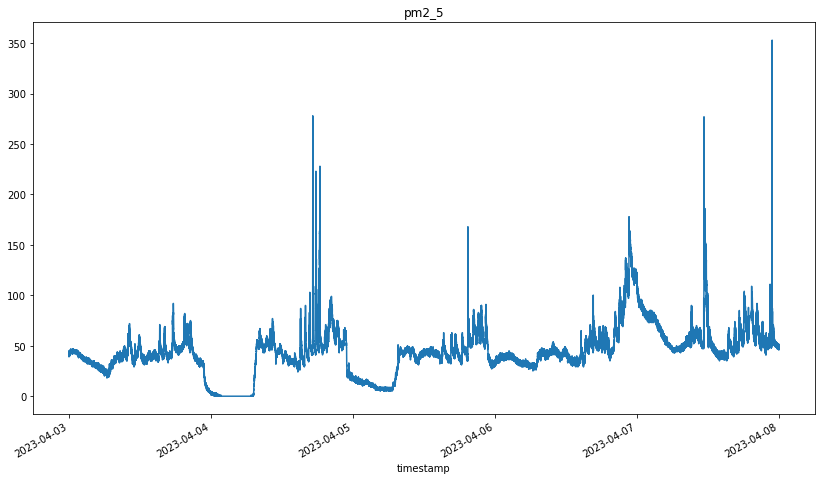

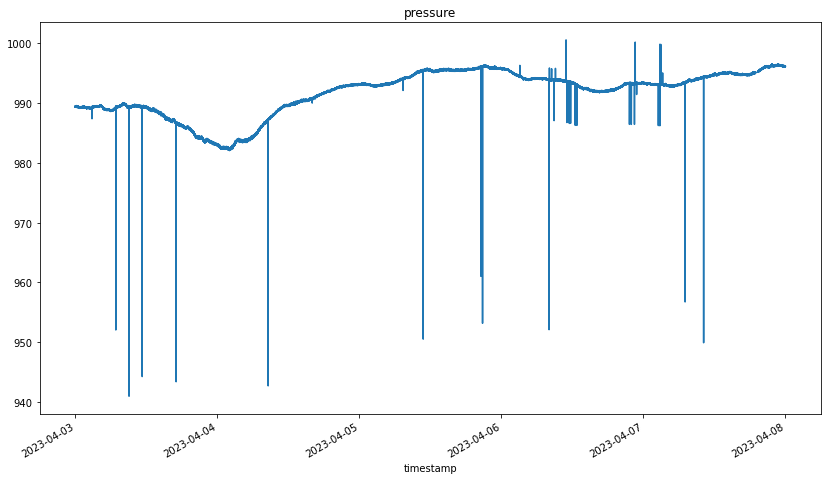

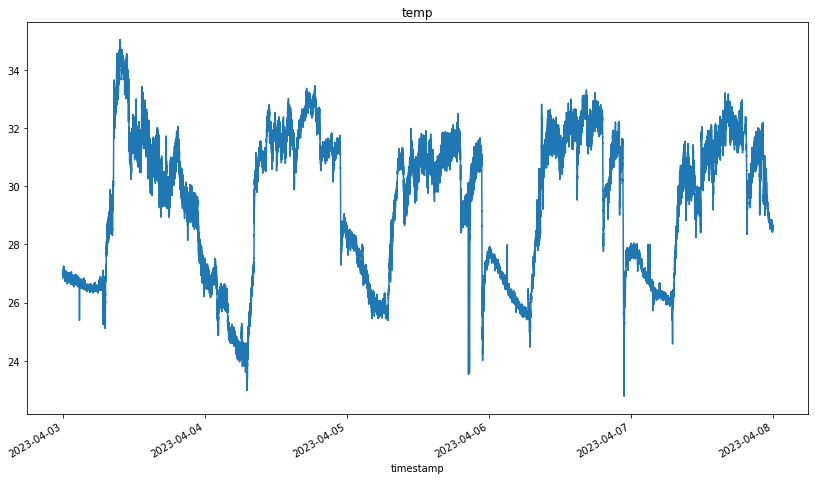

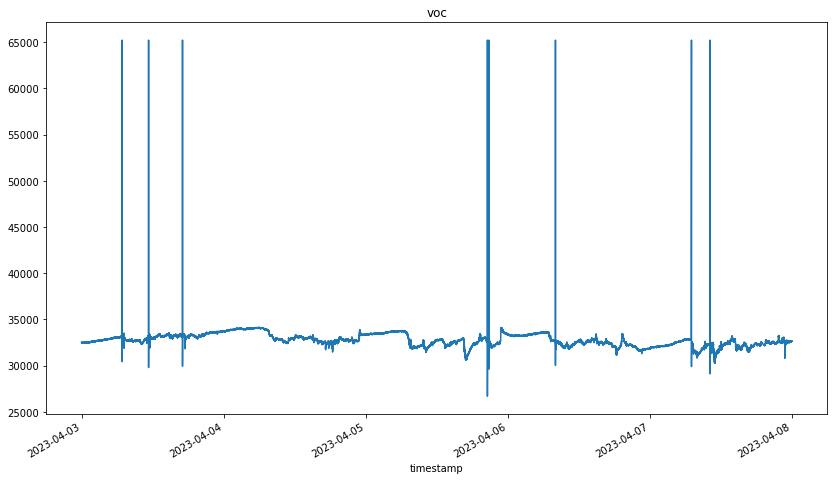

In [6]:
for column in df_indexed_env_data.columns:
    df_indexed_env_data[column].plot(figsize = (14, 8), title = column)
    plt.show()

<h2>1.2 Energy data</h2>

In [7]:
energy_data.shape

(414969, 23)

In [8]:
energy_data.head()

,timestamp,Active Power A average [kW],Active Power B average [kW],Active Power C average [kW],Current A average [A],Current B average [A],Current C average [A],Frequency average [Hz],Power Factor A average,Power Factor B average,...,Reactive Power C average [kVAr],THDI A average [%],THDI B average [%],THDI C average [%],THDU A average [%],THDU B average [%],THDU C average [%],Voltage A average [V],Voltage B average [V],Voltage C average [V]
0,2023-04-03 00:00:02,0.0,0.0,0.0,0.002,0.003,0.002,49.995998,1.0,1.0,...,0.0,0.0,0.0,0.0,1.9,1.9,1.9,241.125000,241.602005,240.850998
1,2023-04-03 00:00:03,0.0,0.0,0.0,0.002,0.002,0.002,49.992001,1.0,1.0,...,0.0,0.0,0.0,0.0,1.9,1.9,1.9,241.134003,241.727005,240.947006
2,2023-04-03 00:00:04,0.0,0.0,0.0,0.002,0.002,0.002,49.986000,1.0,1.0,...,0.0,0.0,0.0,0.0,1.9,1.9,1.9,241.175995,241.651993,240.897995
3,2023-04-03 00:00:05,0.0,0.0,0.0,0.002,0.002,0.002,49.985001,1.0,1.0,...,0.0,0.0,0.0,0.0,1.9,1.9,1.9,241.123993,241.621002,240.904999
4,2023-04-03 00:00:06,0.0,0.0,0.0,0.002,0.002,0.002,49.981998,1.0,1.0,...,0.0,0.0,0.0,0.0,1.9,1.9,1.9,241.098007,241.610992,240.912994


<h3>1.2.1 Energy data indexing</h3>

In [9]:
df_indexed_energy_data = energy_data.copy()
df_indexed_energy_data['timestamp'] = pd.to_datetime(df_indexed_energy_data['timestamp'])
df_indexed_energy_data.index = df_indexed_energy_data['timestamp']
del df_indexed_energy_data['timestamp']

<h3> 1.2.2 Energy data visualization </h3>

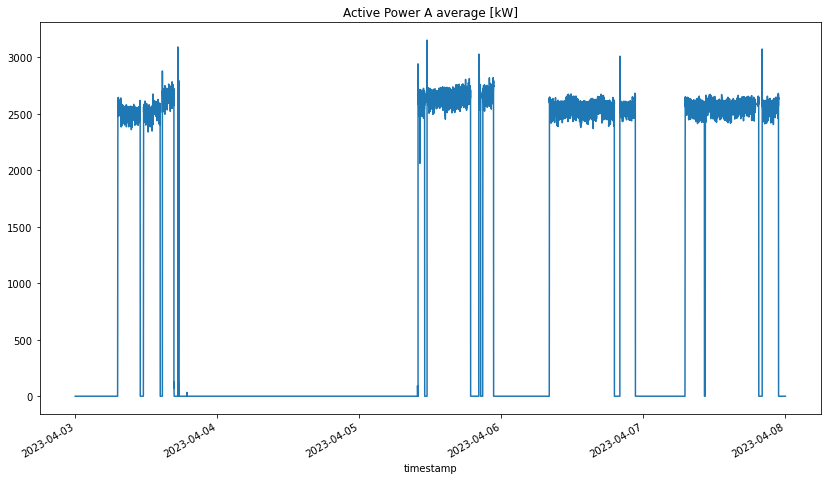

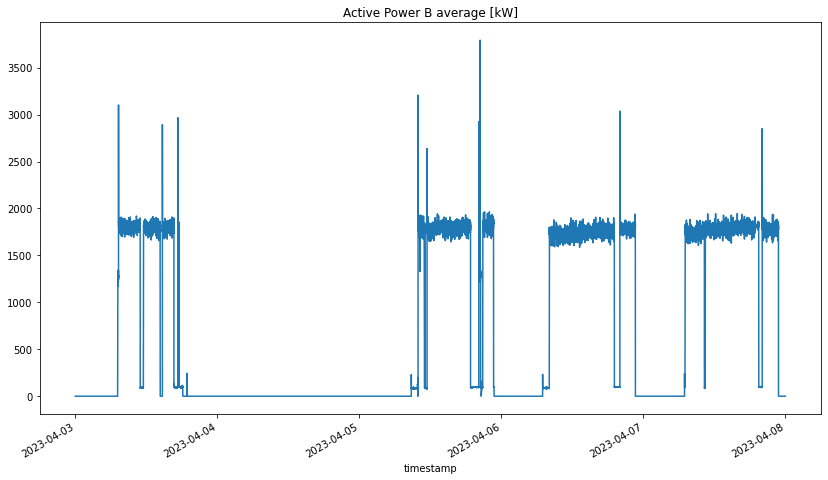

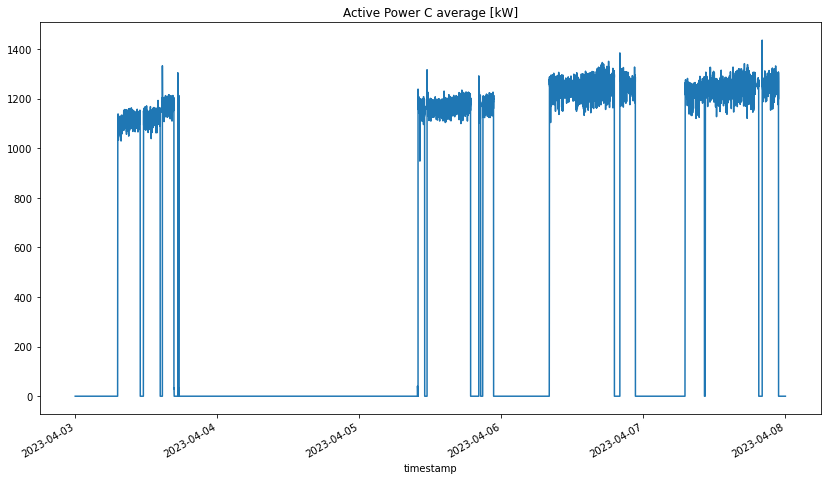

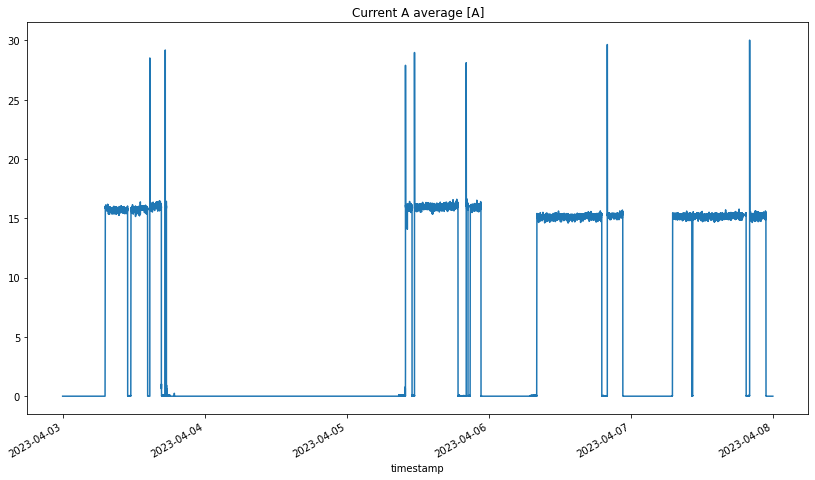

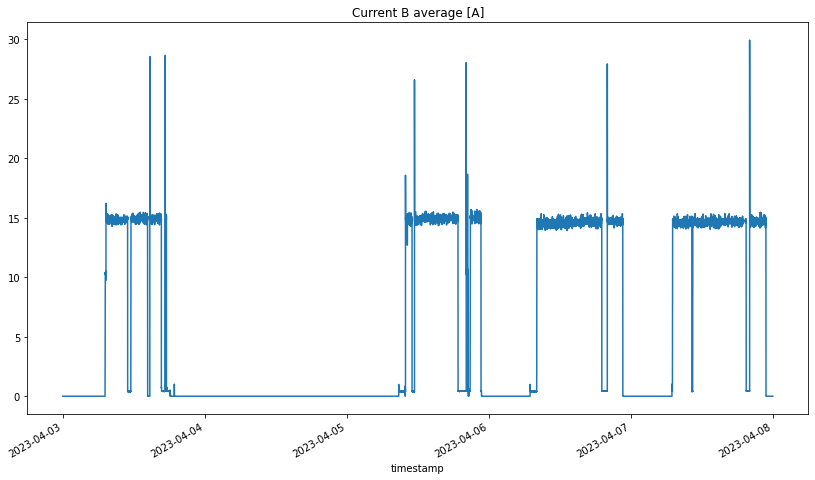

...

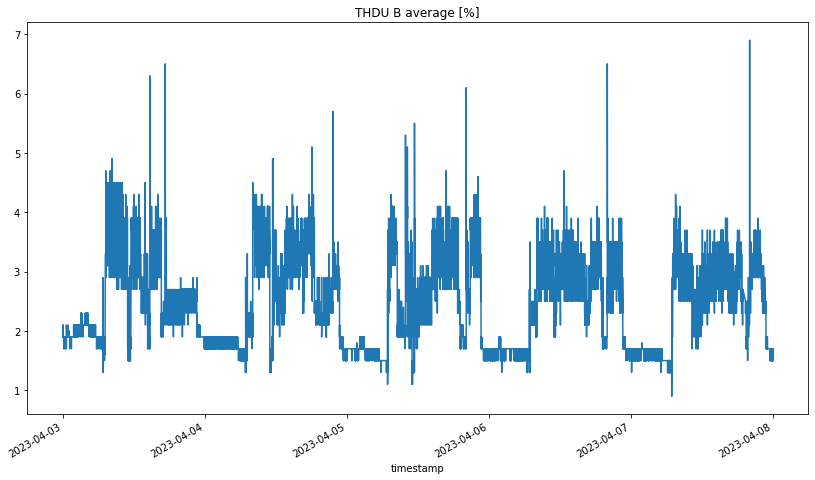

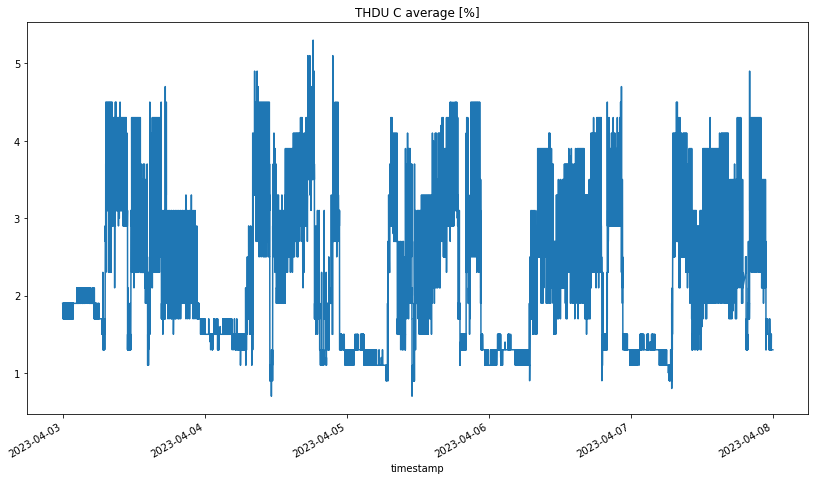

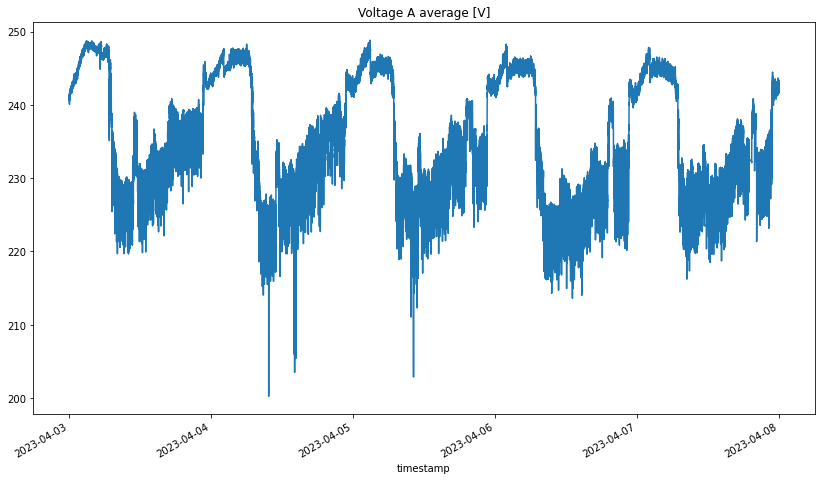

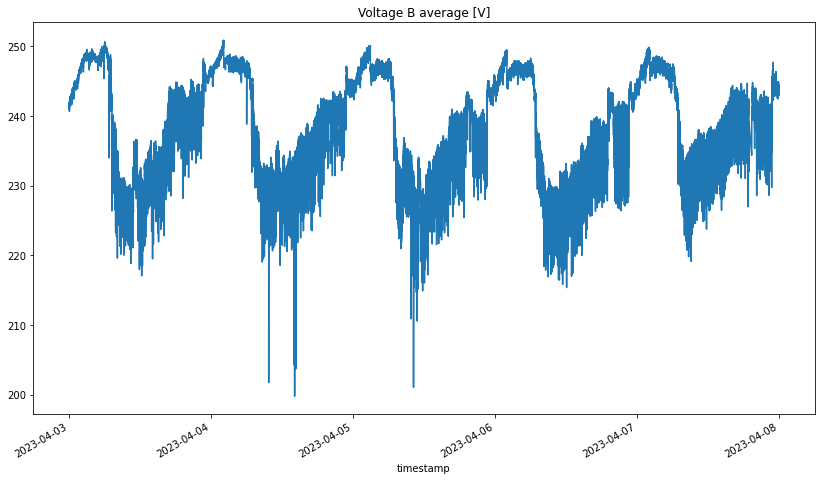

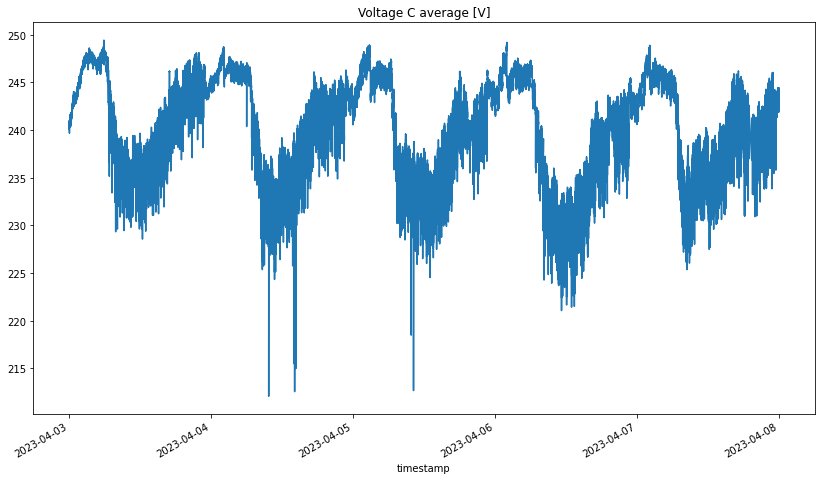

In [10]:
for column in df_indexed_energy_data.columns:
    df_indexed_energy_data[column].plot(figsize = (14, 8), title = column)
    plt.show()

<h1>2 Data preprocessing</h1>

<h2>2.1 Energy data</h2>

<h3>2.1.1 Checking for NaN values in energy data</h3>

In [11]:
df_indexed_energy_data.isna().any().any()

False

<h3>2.1.2 Removing highly correlated attributes in energy data</h3>

In [12]:
corr_matrix = df_indexed_energy_data.corr()

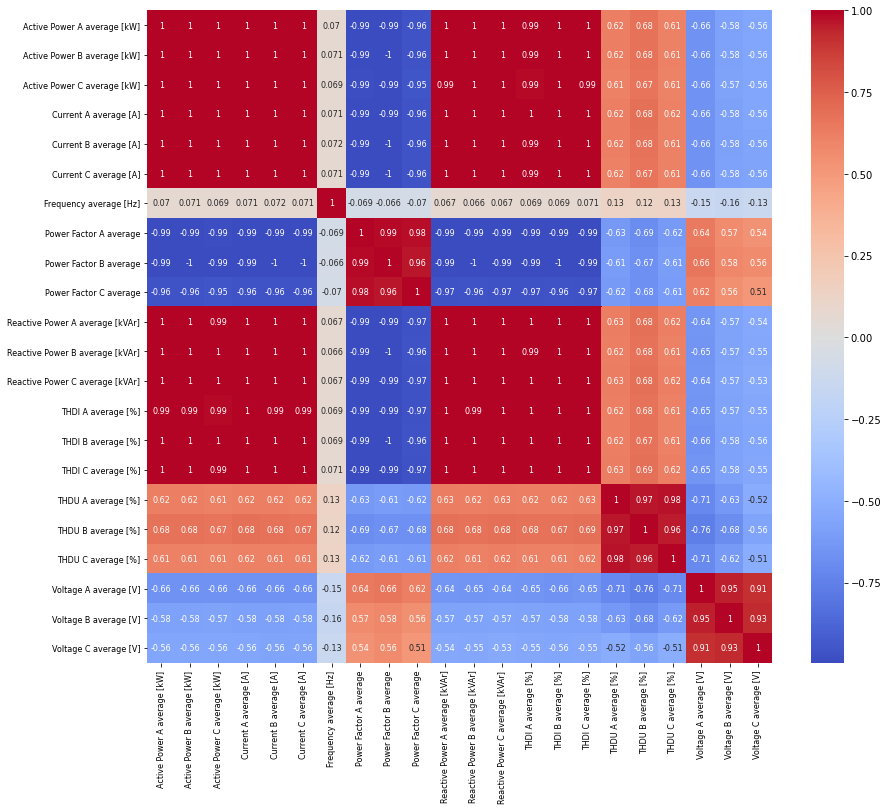

In [13]:
# Create a larger figure
fig, ax = plt.subplots(figsize=(14,12))

# Plot the correlation matrix as a heatmap
sns.heatmap(corr_matrix,
            cmap='coolwarm',
            annot=True,
            ax=ax,
            annot_kws={"fontsize":8},
            xticklabels=corr_matrix.columns,
            yticklabels=corr_matrix.columns)

# Set the font size of the x and y axis tick labels
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)

plt.show()

In [14]:
columns_to_drop = ['Active Power A average [kW]','Active Power B average [kW]', 'Active Power C average [kW]', 
                   'Current B average [A]', 'Current C average [A]',
                   'Reactive Power A average [kVAr]','Reactive Power B average [kVAr]', 'Reactive Power C average [kVAr]', 
                   'THDI A average [%]', 'THDI B average [%]', 'THDI C average [%]',
                   'THDU B average [%]', 'THDU C average [%]',
                   'Power Factor A average', 'Power Factor B average', 'Power Factor C average',
                   'Voltage B average [V]',
                  ]
df_energy_data_without_high_correlated = df_indexed_energy_data.drop(columns_to_drop, axis = 1)

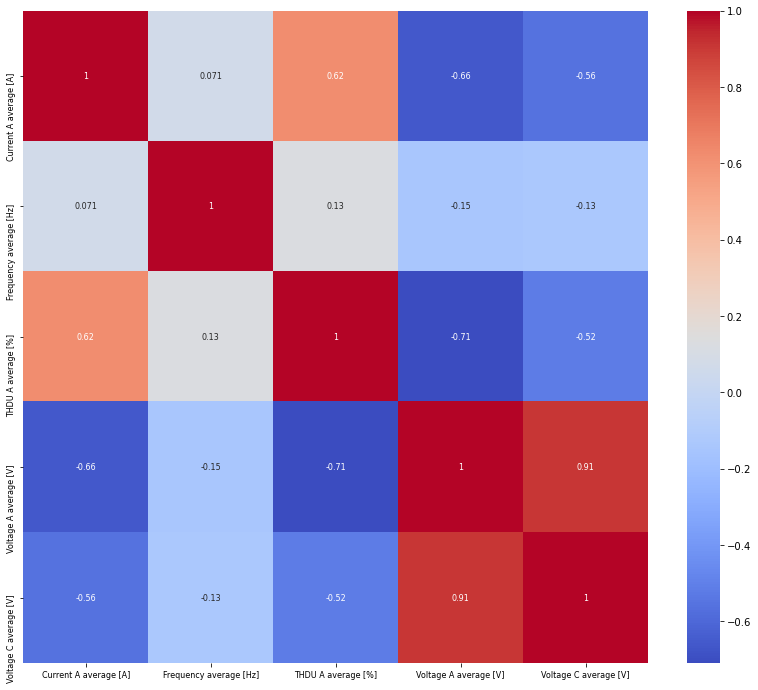

In [15]:
# Calculate the correlation matrix
corr_matrix = df_energy_data_without_high_correlated.corr()

# Create a larger figure
fig, ax = plt.subplots(figsize=(14,12))

# Plot the correlation matrix as a heatmap
sns.heatmap(corr_matrix,
            cmap='coolwarm',
            annot=True,
            ax=ax,
            annot_kws={"fontsize":8},
            xticklabels=corr_matrix.columns,
            yticklabels=corr_matrix.columns)

# Set the font size of the x and y axis tick labels
ax.tick_params(axis='x', labelsize=8)
ax.tick_params(axis='y', labelsize=8)

plt.show()

<h2>2.2 Environmental data </h2>

<h3>2.2.1 Checking for NaN values in environment data </h3>

In [16]:
df_indexed_env_data.isna().any().any()

True

In [17]:
num_rows_with_nan = df_indexed_env_data.isna().any(axis=1).sum()
num_rows_with_nan

23

In [18]:
df_indexed_env_data.dropna(inplace=True)

In [19]:
df_indexed_env_data.isna().any().any()

False

In [20]:
df_indexed_energy_data.shape

(414969, 22)

In [21]:
df_indexed_env_data.shape

(492473, 8)

<h2>2.3 Resampling (at a frequency of 1Hz)</h2>

<h3>2.3.1 Resampling energy data</h3>

<h4>2.3.1.1 Resampling energy dataset of weakly correlated features</h4>

In [22]:
df_resampled_weakly_energy = df_energy_data_without_high_correlated.resample('1S').mean()
df_interpolated_weakly_energy = df_resampled_weakly_energy.interpolate()

In [23]:
df_interpolated_weakly_energy.shape

(432000, 5)

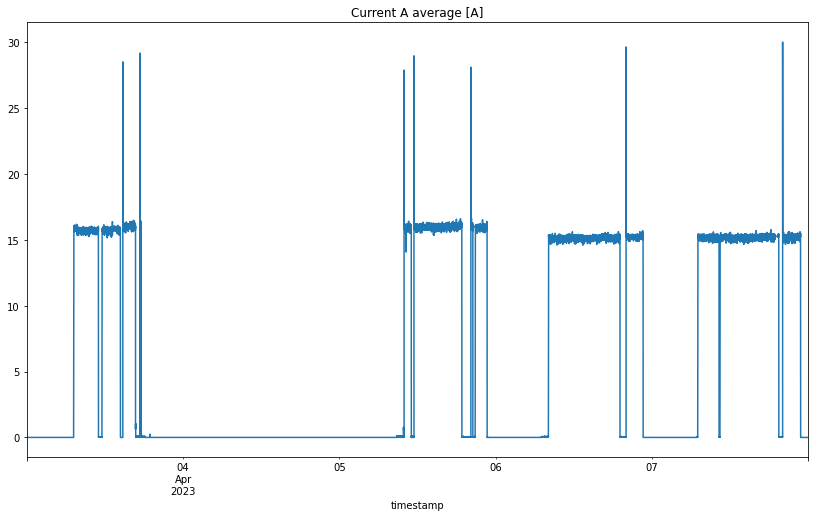

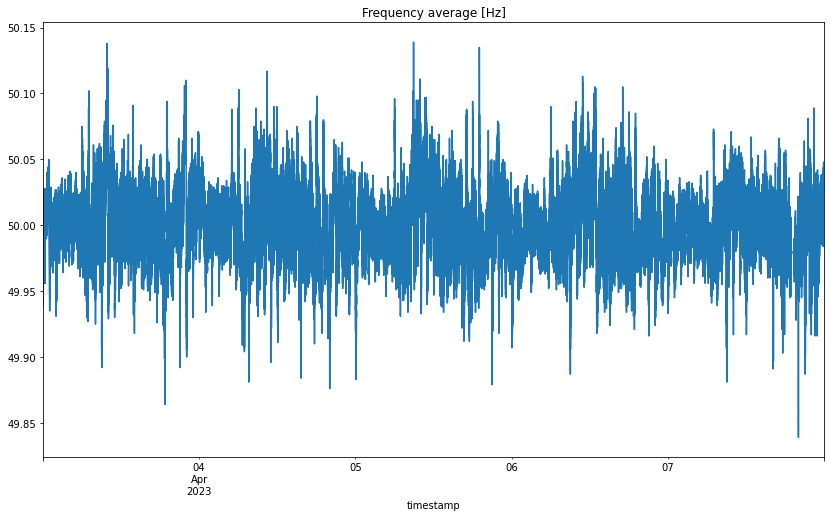

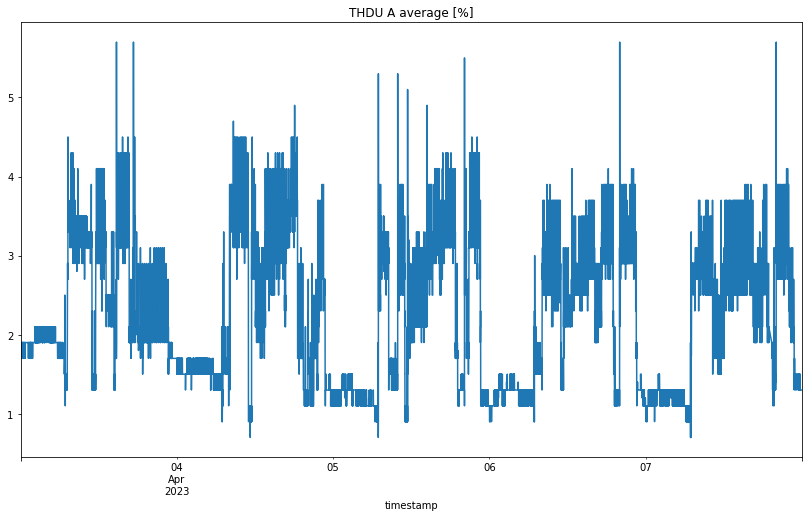

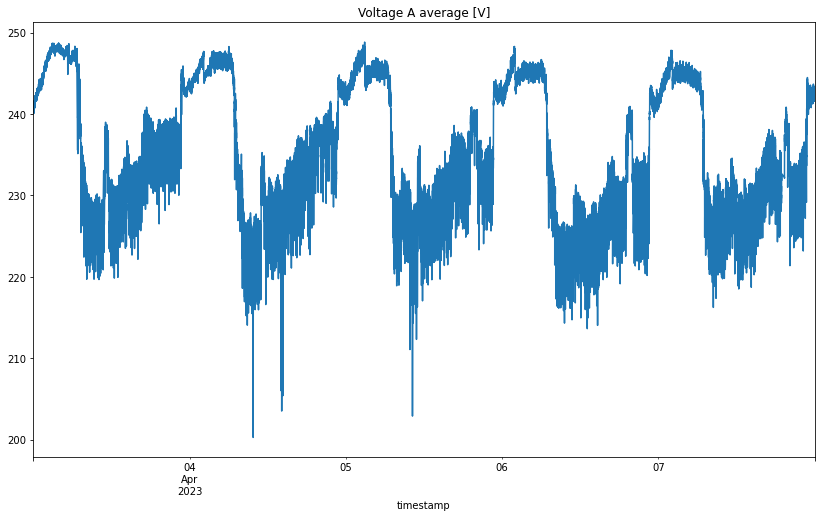

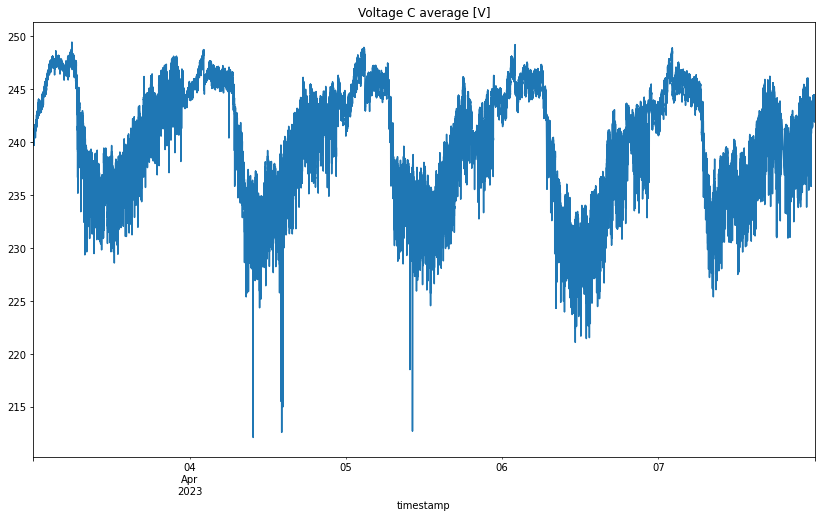

In [24]:
for column in df_interpolated_weakly_energy.columns:
    df_interpolated_weakly_energy[column].plot(figsize = (14, 8), title = column)
    plt.show()

In [25]:
df_interpolated_weakly_energy.isna().any().any()

False

<h4>2.3.1.2 Resampling energy dataset</h4>

In [26]:
df_resampled_energy = df_indexed_energy_data.resample('1S').mean()
df_interpolated_energy = df_resampled_energy.interpolate()

<h3>2.3.2 Resampling environmental data</h3>

In [27]:
df_resampled_env = df_indexed_env_data.resample('1S').mean()
df_interpolated_env = df_resampled_env.interpolate()

In [28]:
df_interpolated_env.shape

(432000, 8)

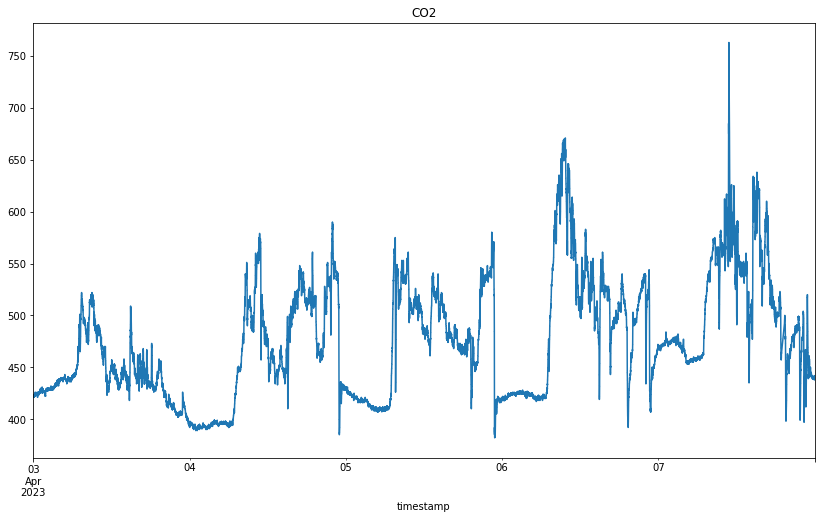

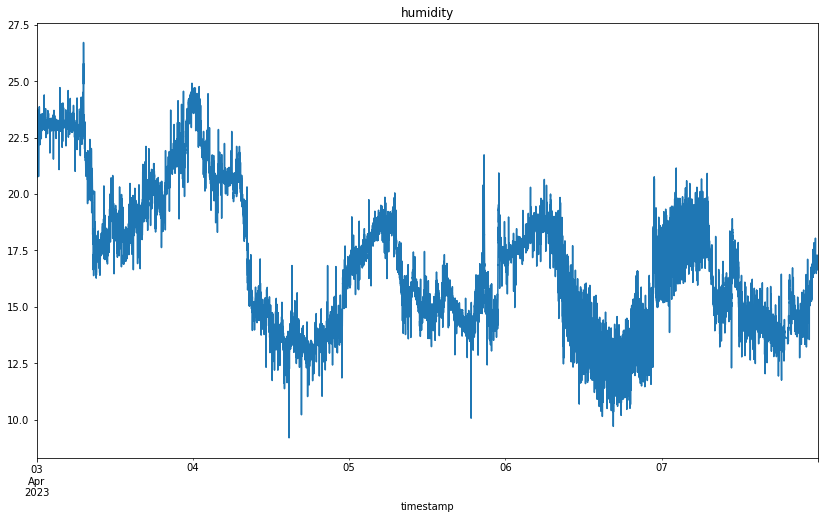

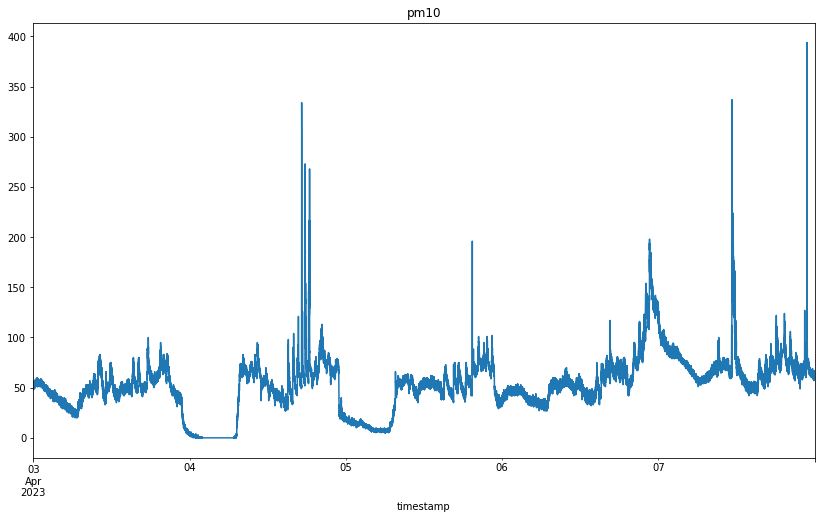

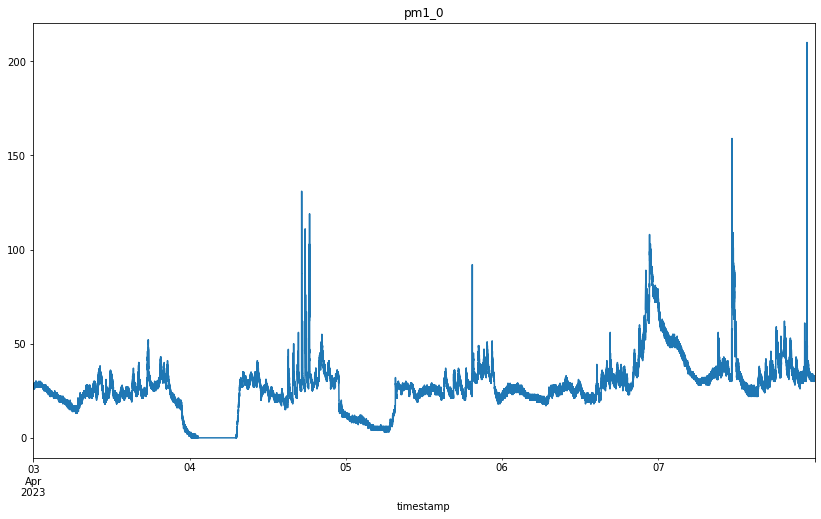

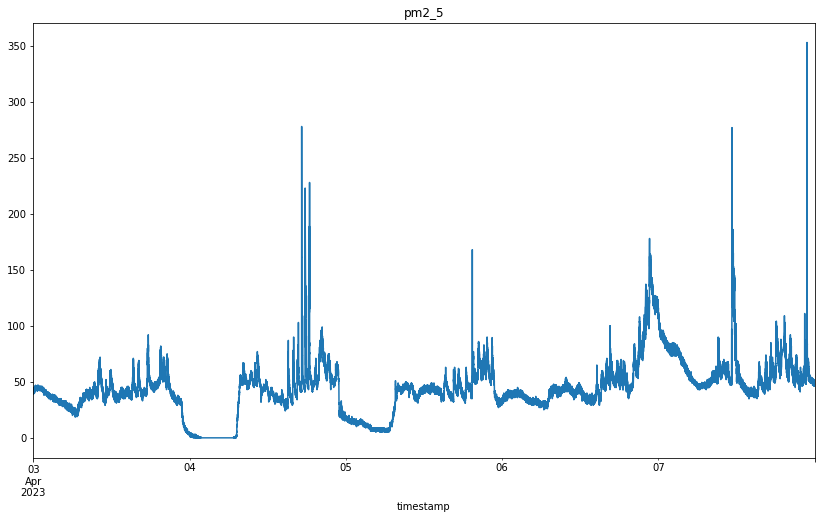

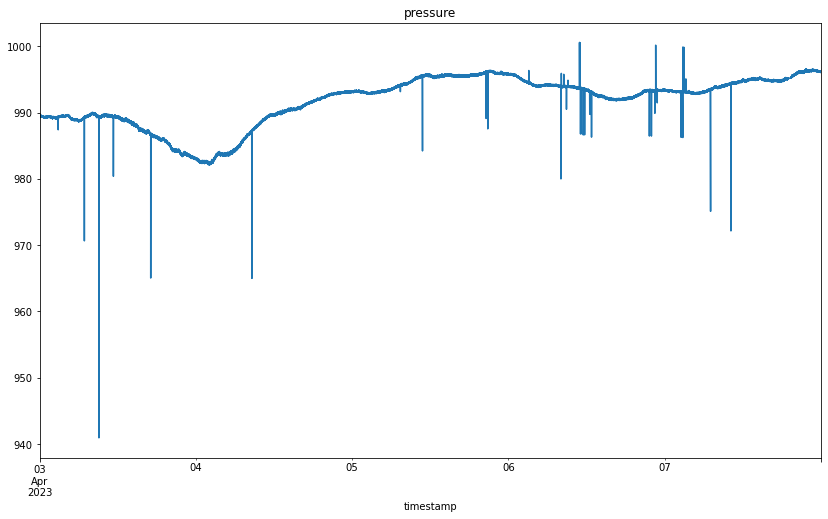

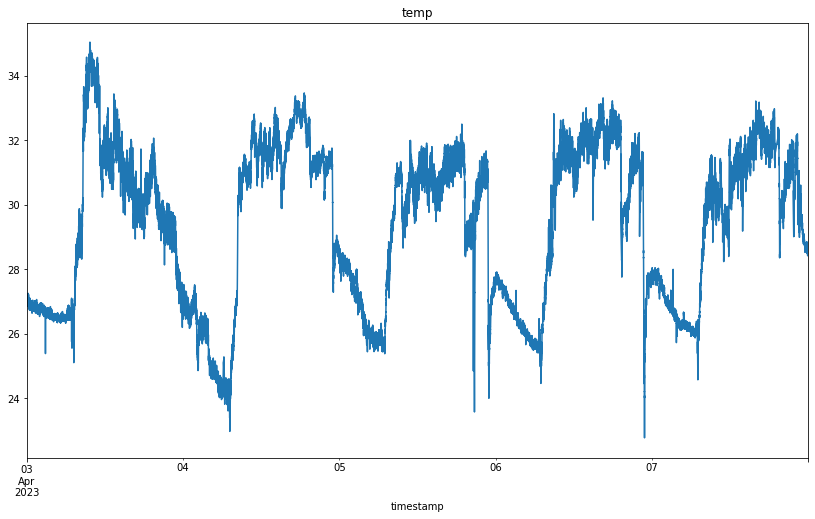

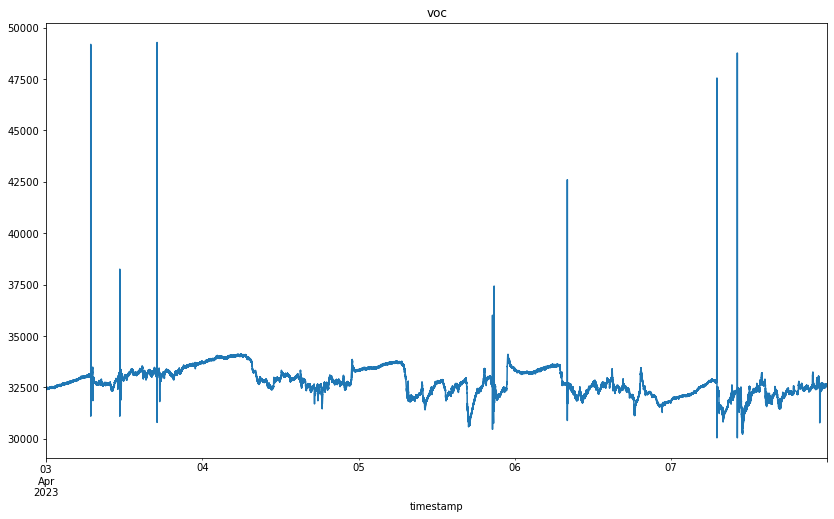

In [29]:
for column in df_interpolated_env.columns:
    df_interpolated_env[column].plot(figsize = (14, 8), title = column)
    plt.show()

In [30]:
df_interpolated_env.isna().any().any()

False

<h2>2.4 Index alignment</h2>

In [31]:
print(df_interpolated_energy.shape)
print(df_interpolated_energy.index[0])
print(df_interpolated_energy.index[-1])

(432000, 22)
2023-04-03 00:00:02
2023-04-08 00:00:01


In [32]:
print(df_interpolated_env.shape)
print(df_interpolated_env.index[0])
print(df_interpolated_env.index[-1])

(432000, 8)
2023-04-03 00:00:00
2023-04-07 23:59:59


<b>After resampling, the indices for energy and environment data are not aligned, so alignment is necessary.</b>

In [33]:
# align
df_interpolated_energy = df_interpolated_energy.iloc[:-2]
df_interpolated_env = df_interpolated_env.iloc[2:]

# check indices again
print(df_interpolated_energy.index[0])
print(df_interpolated_energy.index[-1])

print(df_interpolated_env.index[0])
print(df_interpolated_env.index[-1])

2023-04-03 00:00:02
2023-04-07 23:59:59
2023-04-03 00:00:02
2023-04-07 23:59:59


<h1>3 Creating new datasets</h1> 

<h2>3.1 Monday dataset</h2>

In [63]:
# One day, phase A
# Choosing features
columns_to_drop = ['Active Power B average [kW]','Active Power C average [kW]',
                   'Current B average [A]', 'Current C average [A]',
                   'Power Factor B average', 'Power Factor C average',
                   'Reactive Power B average [kVAr]', 'Reactive Power C average [kVAr]', 
                   'THDI B average [%]', 'THDI C average [%]',
                   'THDU B average [%]', 'THDU C average [%]',
                   'Voltage B average [V]', 'Voltage C average [V]'
                  ]
df_phase_A = df_interpolated_energy.drop(columns = columns_to_drop)

# Choosing day
day = pd.Timestamp('2023-04-03')

In [64]:
mask_day = (df_phase_A.index.date == day.date())
df_monday = df_phase_A.loc[mask_day]

In [65]:
# The machine only works when current is different from 0, so we shorten the data set to working hours.
mask_working_hours = (df_phase_A.index.date == day.date()) & (df_phase_A.index.hour >= 7) & (df_phase_A.index.hour < 19)
df_working_hours = df_phase_A.loc[mask_working_hours]

In [66]:
# Due to the demanding calculation of the model it will be taken only before noon.
mask_before_noon = (df_phase_A.index.date == day.date()) & (df_phase_A.index.hour >= 7) & (df_phase_A.index.hour < 12)
df_before_noon = df_phase_A.loc[mask_before_noon]

In [ ]:
# plt.figure(figsize = (14, 8))
# df_one_day_A['Current A average [A]'].plot(title = 'Current A average [A]')

# plt.figure(figsize = (14, 8))
# df_working_hours['Current A average [A]'].plot(title = 'Current A average [A]')

# plt.figure(figsize = (14, 8))
# df_before_noon['Current A average [A]'].plot(title = 'Current A average [A]')

In [92]:
start_time = pd.Timestamp('2023-04-03 11:00:00')
end_time = pd.Timestamp('2023-04-03 14:30:00')

mask_two_hours = (df_phase_A.index >= start_time) & (df_phase_A.index < end_time)
df_two_hours = df_phase_A.loc[mask_two_hours]

In [110]:
df_two_hours = df_two_hours[df_two_hours['THDI A average [%]'] > 0]
df_energy_3 = df_two_hours

In [105]:
df_two_hours.head(1)

,Active Power A average [kW],Current A average [A],Frequency average [Hz],Power Factor A average,Reactive Power A average [kVAr],THDI A average [%],THDU A average [%],Voltage A average [V]
timestamp,,,,,,,,
2023-04-03 11:31:01,22.84373,0.175036,49.989921,0.998063,17.998405,0.454955,1.516216,236.844168


In [106]:
df_two_hours.tail(1)

,Active Power A average [kW],Current A average [A],Frequency average [Hz],Power Factor A average,Reactive Power A average [kVAr],THDI A average [%],THDU A average [%],Voltage A average [V]
timestamp,,,,,,,,
2023-04-03 14:20:51,2544.888916,15.781,49.983002,0.782,2025.156006,51.900002,2.5,233.574997


<h2>3.2 Helper Functions</h2>

features (X), 
treatment variable (T), 
outcome variable (Y)

In [38]:
# parameter is the name of the column representing the treatment
# this method creates a dataframe of covariates
def create_X(df, treatment):
    
    X = df.copy()
    X = X.drop(treatment, axis=1)
    return X 

In [39]:
# create datasets for all possible combinations of control variables
def create_all_Xs(df):
    
    columns = df.columns
    Xs = []
    for column in columns:
        X = create_X(df, column)
        Xs.append(X)
    return Xs

In [40]:
# this method creates a dataframe of outcome
def create_Y(df, name, day=pd.Timestamp('2023-04-03')):
    
    df_y = df[name].copy()
    mask = (df_y.index.date == day.date()) & (df_y.index.hour >= 7) & (df_y.index.hour < 12)
    df_y = df_y.loc[mask]
    return df_y

In [162]:
# create list of all possible outcomes
def create_all_Ys(df):
    
    columns = df.columns
    Ys = []
    for column in columns:
        Y = df[column].copy()
        Ys.append(Y)
    return Ys

<h1>4 Econ ML</h1>

In [42]:
# pip install econml

In [43]:
import econml

<h2>4.1 Data Preparation</h2>

In [147]:
Xs = create_all_Xs(df_before_noon)
Ys = create_all_Ys(df_interpolated_env)

# X = create_X(df_before_noon, 'Current A average [A]')
# T = df_before_noon['Current A average [A]']
Y = create_Y(df_interpolated_env, 'CO2')

<h2>4.2 Model </h2>

We choose Orthogonal Random Forest (ORF), because it is intended for use cases when both treatment and output variables are continuous.

In [48]:
from econml.dml import LinearDML
from sklearn.ensemble import RandomForestRegressor

<h3>4.2.1 Create and train the model</h3>

model_y - outcome model <p>
model_t - treatment model

In [49]:
est = LinearDML(model_y=RandomForestRegressor(),
                model_t=RandomForestRegressor())

In [50]:
# Here, the effects of energy data on CO2 are examined
fitted_models = {}

for X, (column_name, T) in zip(Xs, df_before_noon.iteritems()):
    start_time = time.time()
    est.fit(Y, T, X=X)
    end_time = time.time()
    training_time = end_time - start_time
    
    model_outputs = {
        'pnt_effect': est.const_marginal_effect(X),
        'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
        'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
        'pnt_coef': est.coef_,
        'lb_coef': est.coef__interval(alpha=.05)[0],
        'ub_coef': est.coef__interval(alpha=.05)[1],
        'training_time': training_time
    }

    fitted_models[column_name] = model_outputs
    
    print(f"Training time: {training_time} seconds")  

Training time: 54.459510803222656 seconds
Training time: 103.58435297012329 seconds
Training time: 117.60210847854614 seconds
Training time: 134.62176632881165 seconds
Training time: 116.51866960525513 seconds
Training time: 110.34131336212158 seconds
Training time: 129.61069989204407 seconds
Training time: 96.37736916542053 seconds


<h3>4.2.2 Model outputs visualization</h3>

<h4>4.2.2.1 CATE - Conditional Average Treatment Effect</h4>

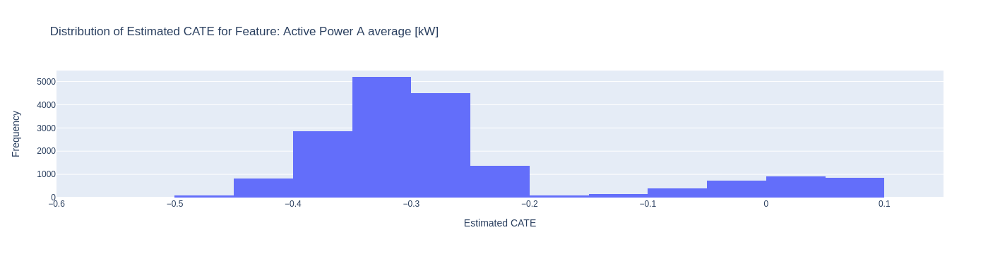

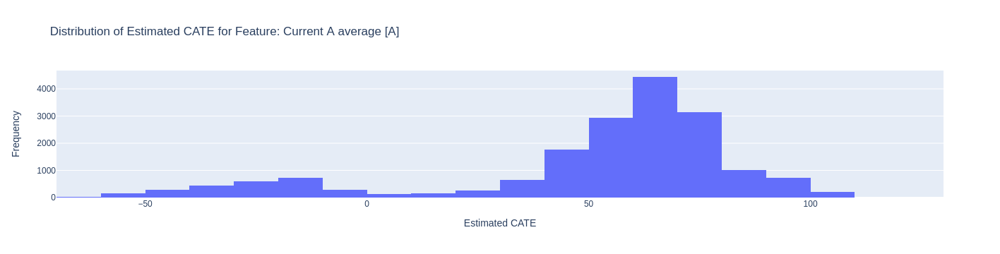

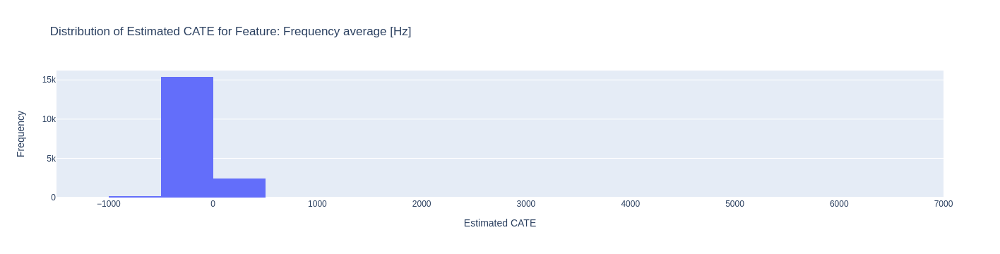

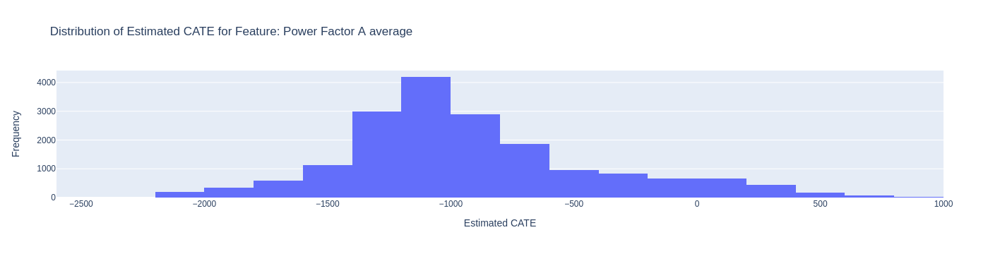

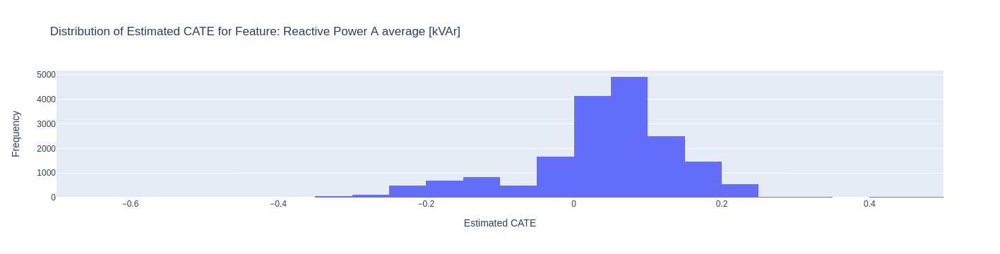

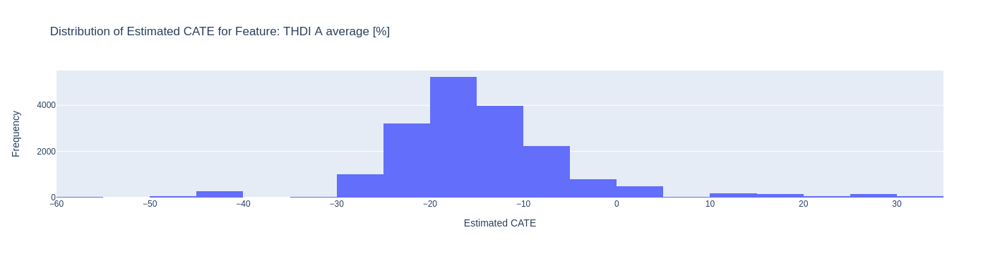

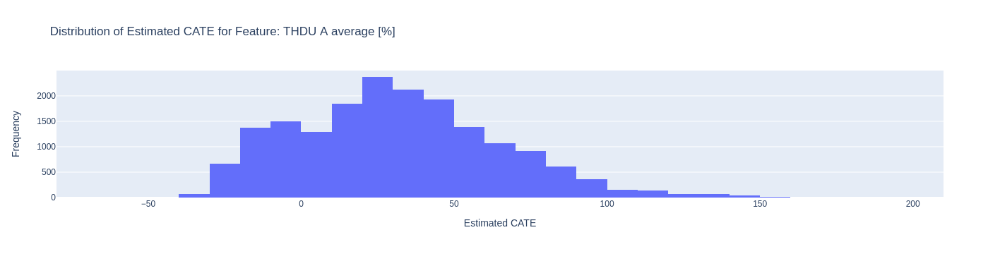

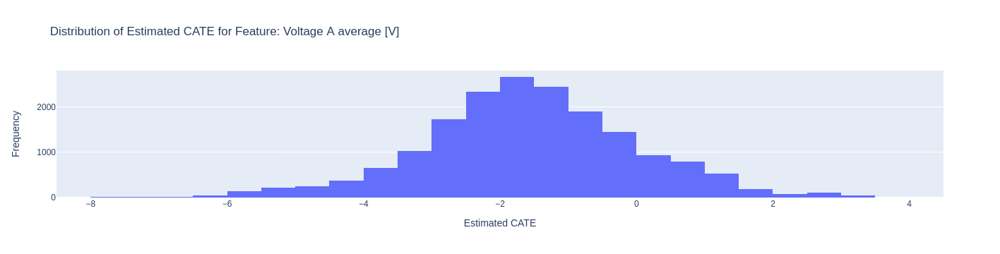

In [51]:
for model in fitted_models:

    # Create a histogram of the CATE estimates - Conditional Average Treatment Effect
    fig = go.Figure(data=[go.Histogram(x=fitted_models[model]['pnt_effect'], nbinsx=30)])
    
    fig.update_layout(
        title_text='Distribution of Estimated CATE for Feature: {}'.format(model), 
        xaxis_title_text='Estimated CATE', 
        yaxis_title_text='Frequency', 
    )
    
    fig.show()

<h4>4.2.2.2 ATE - Average Treatment Effect</h4>

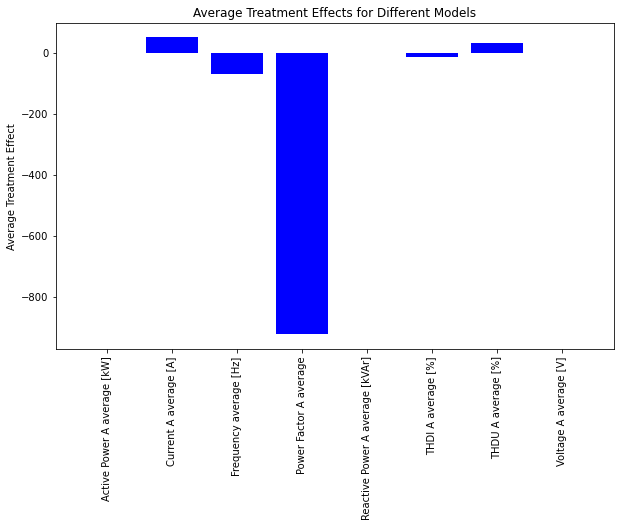

In [52]:
import pandas as pd
import matplotlib.pyplot as plt

# Initialize a dictionary to store the ATEs
ate_dict = {}

for model in fitted_models:
    
    # Estimate the CATE
    cate_estimates = fitted_models[model]['pnt_effect']

    # Estimate the ATE by taking the average of the CATE estimates
    ate_estimate = np.mean(cate_estimates)

    # Store the ATE in the dictionary
    ate_dict[model] = ate_estimate

# Convert the dictionary to a DataFrame
ate_df = pd.DataFrame(list(ate_dict.items()), columns=['Model', 'ATE'])

# Create a bar plot of the ATEs
plt.figure(figsize=(10, 6))
plt.bar(ate_df['Model'], ate_df['ATE'], color='blue')
plt.ylabel('Average Treatment Effect')
plt.title('Average Treatment Effects for Different Models')
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.show()

<h1>Current --> CO2 - For testing purposes</h1>

In [53]:
X_test = create_X(df_before_noon, 'Current A average [A]')
T_test= df_before_noon['Current A average [A]'].values
Y_test = create_Y(df_interpolated_env, 'CO2')

In [54]:
est = LinearDML(model_y=RandomForestRegressor(),
                model_t=RandomForestRegressor())

In [55]:
est.fit(Y_test, T_test, X=X_test)

In [56]:
pnt_effect = est.const_marginal_effect(X_test)
lb_effect, ub_effect = est.const_marginal_effect_interval(X_test, alpha=.05)
pnt_coef = est.coef_
lb_coef, ub_coef = est.coef__interval(alpha=.05)

In [57]:
X_test = create_X(df_before_noon, 'Current A average [A]')
T_test= df_before_noon['Current A average [A]'].values
Y_test = create_Y(df_interpolated_env, 'CO2')

est = LinearDML(model_y=RandomForestRegressor(),
                model_t=RandomForestRegressor())
est.fit(Y_test, T_test, X=X_test)
pnt_effect = est.const_marginal_effect(X_test)
lb_effect, ub_effect = est.const_marginal_effect_interval(X_test, alpha=.05)
pnt_coef = est.coef_
lb_coef, ub_coef = est.coef__interval(alpha=.05)

<h2>Distribution of treatment effects across the data</h2>

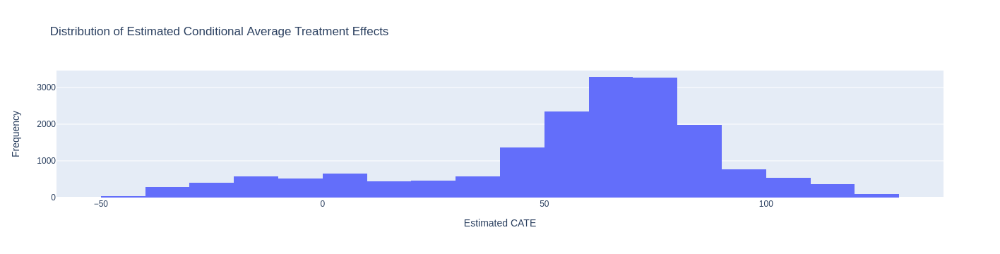

In [58]:
import plotly.graph_objects as go

# Create a histogram of the CATE estimates
fig = go.Figure(data=[go.Histogram(x=pnt_effect, nbinsx=30)])

# Add title and labels
fig.update_layout(
    title_text='Distribution of Estimated Conditional Average Treatment Effects', # title of plot
    xaxis_title_text='Estimated CATE', # xaxis label
    yaxis_title_text='Frequency', # yaxis label
)

fig.show()

In [59]:
import numpy as np

# Estimate the CATE
cate_estimates = est.const_marginal_effect(X_test)

# Estimate the ATE by taking the average of the CATE estimates
ate_estimate = np.mean(cate_estimates)

print("Estimated ATE:", ate_estimate)

Estimated ATE: 56.109606299395544


<h1>5 Including all environmental variables</h1>

In [149]:
# Here, the effects of energy data on all environment variables are examined
environmental_models = {}

for Y in Ys:
    print(Y.name)
    fitted_models = {}
    for X, (column_name, T) in zip(Xs, df_before_noon.iteritems()):
        print(column_name)
        start_time = time.time()
        est.fit(Y, T, X=X)
        end_time = time.time()
        training_time = end_time - start_time

        model_outputs = {
            'pnt_effect': est.const_marginal_effect(X),
            'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
            'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
            'pnt_coef': est.coef_,
            'lb_coef': est.coef__interval(alpha=.05)[0],
            'ub_coef': est.coef__interval(alpha=.05)[1],
            'training_time': training_time
        }

        fitted_models[column_name] = model_outputs
        print(f"Training time: {training_time} seconds") 
    environmental_models[Y.name] = fitted_models

CO2
Active Power A average [kW]
Training time: 69.11143040657043 seconds
Current A average [A]
Training time: 70.03668093681335 seconds
Frequency average [Hz]
Training time: 69.52846026420593 seconds
Power Factor A average
Training time: 76.35737919807434 seconds
Reactive Power A average [kVAr]
Training time: 70.61367464065552 seconds
THDI A average [%]
Training time: 72.37327837944031 seconds
THDU A average [%]
Training time: 78.618155002594 seconds
Voltage A average [V]
Training time: 70.6870379447937 seconds
humidity
Active Power A average [kW]
Training time: 65.97343492507935 seconds
Current A average [A]
Training time: 66.69862794876099 seconds
Frequency average [Hz]
Training time: 72.77394437789917 seconds
Power Factor A average
Training time: 67.94118189811707 seconds
Reactive Power A average [kVAr]
Training time: 67.42997169494629 seconds
THDI A average [%]
Training time: 71.92944288253784 seconds
THDU A average [%]
Training time: 73.03548216819763 seconds
Voltage A average [V]

In [ ]:
# TODO Visualization

<h1>6 Three hours dataset</h1>

In [114]:
df_energy_3.shape

(10191, 8)

In [112]:
df_env_3 = df_interpolated_env.loc[df_two_hours.index[0]:df_two_hours.index[-1]]

<h2>6.1 Data preparation</h2>

In [ ]:
Xs = create_all_Xs(df_before_noon)

# X = create_X(df_before_noon, 'Current A average [A]')
# T = df_before_noon['Current A average [A]']
# Y = create_Y(df_interpolated_env, 'CO2')

<h2>6.2 Models</h2>

In [ ]:
# TODO svi modeli nad ovim dataset-om

In [ ]:
# TODO dodati kod za modele

<h1>7 Normalized data set</h1>

In [ ]:
#TODO normalizovati podatke + modeli

In [117]:
scaler = StandardScaler()
df_energy_3_normalized = pd.DataFrame(scaler.fit_transform(df_energy_3), 
                                      columns=df_energy_3.columns, 
                                      index=df_energy_3.index)

df_env_3_normalized = pd.DataFrame(scaler.fit_transform(df_env_3), 
                                      columns=df_env_3.columns, 
                                      index=df_env_3.index)

In [130]:
df_energy_3_normalized.shape

(10191, 8)

In [158]:
df_env_3_normalized.shape

(10191, 8)

<h2>7.1 Data preparation for normalized data set</h2>

In [172]:
Xs = create_all_Xs(df_energy_3_normalized)
Ys = create_all_Ys(df_env_3_normalized)

# X = create_X(df_before_noon, 'Current A average [A]')
# T = df_before_noon['Current A average [A]']
Y = create_Y(df_env_3_normalized, 'CO2')

In [175]:
for X in Xs:
    print(X.shape)

(10191, 7)
(10191, 7)
(10191, 7)
(10191, 7)
(10191, 7)
(10191, 7)
(10191, 7)
(10191, 7)


In [173]:
for Y in Ys:
    print(Y.shape)

(10191,)
(10191,)
(10191,)
(10191,)
(10191,)
(10191,)
(10191,)
(10191,)


<h2>7.2 Models over a normalized data set</h2>

<h3>7.2.1 Effect on CO2 in normalized dataset</h3>

In [176]:
# Here, the effects of energy data on CO2 are examined
fitted_models_normalized = {}

for X, (treatment_name, T) in zip(Xs, df_energy_3_normalized.iteritems()):
    
    start_time = time.time()
    est.fit(df_env_3_normalized['CO2'], T, X=X)
    end_time = time.time()
    training_time = end_time - start_time
    
    model_outputs = {
        'pnt_effect': est.const_marginal_effect(X),
        'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
        'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
        'pnt_coef': est.coef_,
        'lb_coef': est.coef__interval(alpha=.05)[0],
        'ub_coef': est.coef__interval(alpha=.05)[1],
        'training_time': training_time
    }
    
    fitted_models_normalized[column_name] = model_outputs
    
    print(f"Training time: {training_time} seconds")

Training time: 44.71821331977844 seconds
Training time: 52.309592723846436 seconds
Training time: 53.10053300857544 seconds
Training time: 44.84723973274231 seconds
Training time: 42.255181312561035 seconds
Training time: 43.91477155685425 seconds
Training time: 46.858954668045044 seconds
Training time: 40.91845989227295 seconds


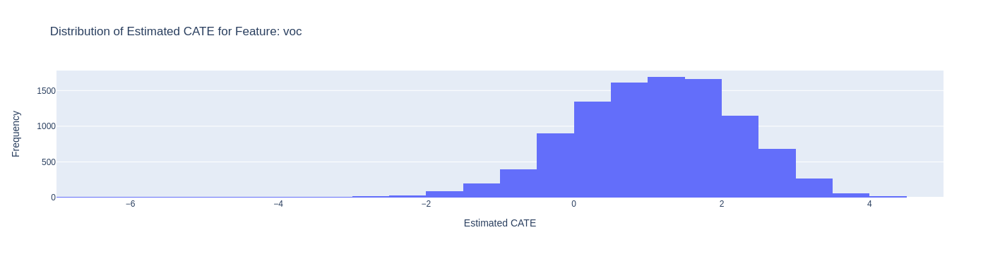

In [177]:
for model in fitted_models_normalized:

    # Create a histogram of the CATE estimates - Conditional Average Treatment Effect
    fig = go.Figure(data=[go.Histogram(x=fitted_models_normalized[model]['pnt_effect'], nbinsx=30)])
    
    fig.update_layout(
        title_text='Distribution of Estimated CATE for Feature: {}'.format(model), 
        xaxis_title_text='Estimated CATE', 
        yaxis_title_text='Frequency', 
    )
    
    fig.show()

<h3>7.2.1 The effect of each energy parameter on each environmental parameter in the normalized data set</h3>

In [167]:
# Here, the effects of energy data on all environment variables are examined
# Current
environmental_models_normalized = {}

for Y in Ys:
    print(Y.name)
    fitted_models_normalized = {}
    for X, (treatment_name, T) in zip(Xs, df_energy_3_normalized.iteritems()):
        print(treatment_name)
        start_time = time.time()
        est.fit(Y, T, X=X)
        end_time = time.time()
        training_time = end_time - start_time

        model_outputs = {
            'pnt_effect': est.const_marginal_effect(X),
            'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
            'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
            'pnt_coef': est.coef_,
            'lb_coef': est.coef__interval(alpha=.05)[0],
            'ub_coef': est.coef__interval(alpha=.05)[1],
            'training_time': training_time
        }

        fitted_models_normalized[column_name] = model_outputs
        print(f"Training time: {training_time} seconds") 
    environmental_models_normalized[Y.name] = fitted_models

CO2
Active Power A average [kW]
Training time: 41.307297706604004 seconds
Current A average [A]
Training time: 44.449859619140625 seconds
Frequency average [Hz]
Training time: 54.28995132446289 seconds
Power Factor A average
Training time: 47.073402404785156 seconds
Reactive Power A average [kVAr]
Training time: 52.77248978614807 seconds
THDI A average [%]
Training time: 54.70496654510498 seconds
THDU A average [%]
Training time: 61.182769775390625 seconds
Voltage A average [V]
Training time: 53.27996373176575 seconds
humidity
Active Power A average [kW]
Training time: 49.25359749794006 seconds
Current A average [A]
Training time: 51.08787536621094 seconds
Frequency average [Hz]
Training time: 51.516637086868286 seconds
Power Factor A average
Training time: 51.299179792404175 seconds
Reactive Power A average [kVAr]
Training time: 52.23353385925293 seconds
THDI A average [%]
Training time: 55.58798408508301 seconds
THDU A average [%]
Training time: 55.3038113117218 seconds
Voltage A ave

In [ ]:
#TODO Dodati vizuelizaciju

<h1>8 Differentiated data set</h1>

In [ ]:
#TODO diferencirati podatke + modeli

In [141]:
df_energy_3_diff = df_energy_3.diff()
df_env_3_diff = df_env_3.diff()

df_energy_3_diff = df_energy_3_diff.dropna()
df_env_3_diff = df_env_3_diff.dropna()

<h2>8.1 Data preparation</h2>

In [180]:
Xs = create_all_Xs(df_energy_3_diff)
Ys = create_all_Ys(df_env_3_diff)

# X = create_X(df_before_noon, 'Current A average [A]')
# T = df_before_noon['Current A average [A]']

<h2>8.2 Models over a differentiated data set</h2>

<h3>8.1.1 Effect on CO2</h3>

In [169]:
# Here, the effects of energy data on CO2 are examined
fitted_models_diff = {}

for X, (treatment_name, T) in zip(Xs, df_energy_3_diff.iteritems()):
    
    start_time = time.time()
    est.fit(df_env_3_diff['CO2'], T, X=X)
    end_time = time.time()
    training_time = end_time - start_time
    
    model_outputs = {
        'pnt_effect': est.const_marginal_effect(X),
        'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
        'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
        'pnt_coef': est.coef_,
        'lb_coef': est.coef__interval(alpha=.05)[0],
        'ub_coef': est.coef__interval(alpha=.05)[1],
        'training_time': training_time
    }
    
    fitted_models_diff[column_name] = model_outputs
    
    print(f"Training time: {training_time} seconds")

Training time: 32.38310956954956 seconds
Training time: 35.138745069503784 seconds
Training time: 42.36945080757141 seconds
Training time: 47.58449745178223 seconds
Training time: 39.89624571800232 seconds
Training time: 46.462806224823 seconds
Training time: 56.0933563709259 seconds
Training time: 43.567399978637695 seconds


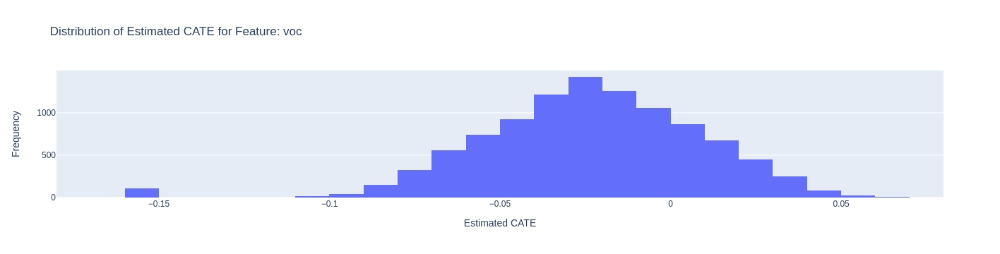

In [170]:
for model in fitted_models_normalized:

    # Create a histogram of the CATE estimates - Conditional Average Treatment Effect
    fig = go.Figure(data=[go.Histogram(x=fitted_models_diff[model]['pnt_effect'], nbinsx=30)])
    
    fig.update_layout(
        title_text='Distribution of Estimated CATE for Feature: {}'.format(model), 
        xaxis_title_text='Estimated CATE', 
        yaxis_title_text='Frequency', 
    )
    
    fig.show()

In [ ]:
# Distribucije uticaja izgledaju poprilično normalizovano ali ne znam šta to znači.

<h3>8.1.2 The effect of each energy parameter on each environmental parameter in the differentiated data set</h3>

In [ ]:
# TODO: Pokrenuti grid

In [181]:
# Here, the effects of energy data on all environment variables are examined
# Current
environmental_models_differentiated = {}

for Y in Ys:
    print(Y.name)
    fitted_models_differentiated = {}
    for X, (treatment_name, T) in zip(Xs, df_energy_3_diff.iteritems()):
        print(treatment_name)
        start_time = time.time()
        est.fit(Y, T, X=X)
        end_time = time.time()
        training_time = end_time - start_time

        model_outputs = {
            'pnt_effect': est.const_marginal_effect(X),
            'lb_effect': est.const_marginal_effect_interval(X, alpha=.05)[0],
            'ub_effect': est.const_marginal_effect_interval(X, alpha=.05)[1],
            'pnt_coef': est.coef_,
            'lb_coef': est.coef__interval(alpha=.05)[0],
            'ub_coef': est.coef__interval(alpha=.05)[1],
            'training_time': training_time
        }

        fitted_models_differentiated[column_name] = model_outputs
        print(f"Training time: {training_time} seconds") 
    environmental_models_differentiated[Y.name] = fitted_models

CO2
Active Power A average [kW]
Training time: 36.75386023521423 seconds
Current A average [A]
Training time: 40.102208375930786 seconds
Frequency average [Hz]
Training time: 43.899290323257446 seconds
Power Factor A average
Training time: 46.029053926467896 seconds
Reactive Power A average [kVAr]
Training time: 39.59107065200806 seconds
THDI A average [%]
Training time: 45.00543665885925 seconds
THDU A average [%]
Training time: 51.83066749572754 seconds
Voltage A average [V]
Training time: 41.25392270088196 seconds
humidity
Active Power A average [kW]
Training time: 45.11643099784851 seconds
Current A average [A]
Training time: 48.32112646102905 seconds
Frequency average [Hz]
Training time: 48.36343765258789 seconds
Power Factor A average
Training time: 52.107996702194214 seconds
Reactive Power A average [kVAr]
Training time: 45.74382495880127 seconds
THDI A average [%]
Training time: 56.21717143058777 seconds
THDU A average [%]
Training time: 57.83032488822937 seconds
Voltage A aver

In [ ]:
# TODO: Dodati vizualizaciju